# Importation des librairies

In [ ]:
# enable plots in the notebook
import matplotlib.pyplot as plt
# makes our plots prettier
import seaborn
seaborn.set(style='ticks')

#import the audio playback widget
from IPython.display import Audio
from scipy import signal

# useful librairies
import mir_eval
import numpy as np
import scipy
import librosa
import librosa.display
from pydub import AudioSegment 
from ModulationPy import PSKModem, QAMModem

import wave
from scipy.io import wavfile
import contextlib

from turtle import *
import math

# Visualisation de la chanson porteuse

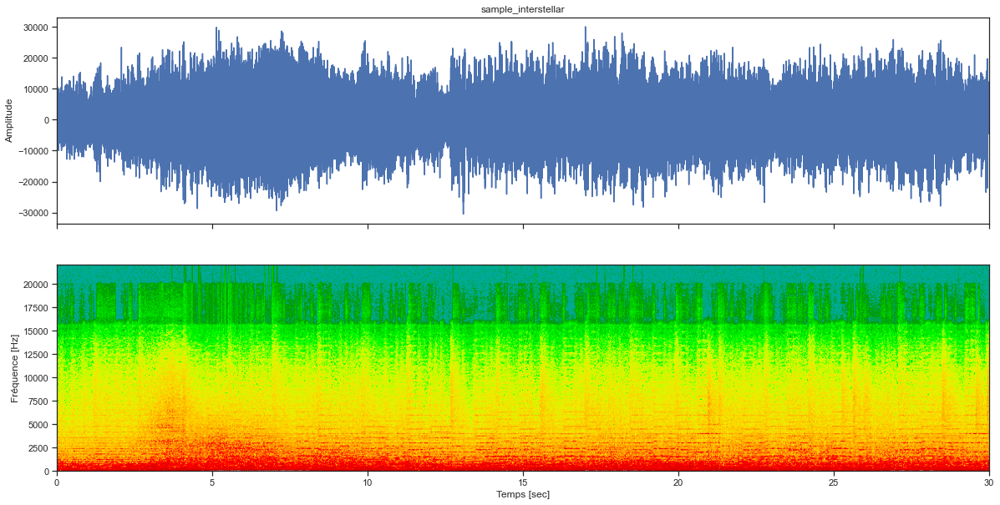

In [1102]:
def interpret_wav(raw_bytes, n_frames, n_channels, sample_width, interleaved = True):

    if sample_width == 1:
        dtype = np.uint8 # unsigned char
    elif sample_width == 2:
        dtype = np.int16 # signed 2-byte short
    else:
        raise ValueError("Only supports 8 and 16 bit audio formats.")

    channels = np.frombuffer(raw_bytes, dtype=dtype)

    if interleaved:
        # channels are interleaved, i.e. sample N of channel M follows sample N of channel M-1 in raw data
        channels.shape = (n_frames, n_channels)
        channels = channels.T
    else:
        # channels are not interleaved. All samples from channel M occur before all samples from channel M-1
        channels.shape = (n_channels, n_frames)

    return channels

def get_start_end_frames(nFrames, sampleRate, tStart=None, tEnd=None):

    if tStart and tStart*sampleRate<nFrames:
        start = tStart*sampleRate
    else:
        start = 0

    if tEnd and tEnd*sampleRate<nFrames and tEnd*sampleRate>start:
        end = tEnd*sampleRate
    else:
        end = nFrames

    return (start,end,end-start)

def extract_audio(fname, tStart=None, tEnd=None):
    with contextlib.closing(wave.open(fname,'rb')) as spf:
        sampleRate = spf.getframerate()
        ampWidth = spf.getsampwidth()
        nChannels = spf.getnchannels()
        nFrames = spf.getnframes()

        startFrame, endFrame, segFrames = get_start_end_frames(nFrames, sampleRate, tStart, tEnd)

        # Extract Raw Audio from multi-channel Wav File
        spf.setpos(startFrame)
        sig = spf.readframes(segFrames)
        spf.close()

        channels = interpret_wav(sig, segFrames, nChannels, ampWidth, True)

        return (channels, nChannels, sampleRate, ampWidth, nFrames)

def convert_to_mono(channels, nChannels, outputType):
    if nChannels == 2:
        samples = np.mean(np.array([channels[0], channels[1]]), axis=0)  # Convert to mono
    else:
        samples = channels[0]

    return samples.astype(outputType)

def plot_specgram(samples, sampleRate, tStart=None, tEnd=None):
    plt.figure(figsize=(20,10))
    plt.specgram(samples, Fs=sampleRate, NFFT=1024, noverlap=192, cmap='nipy_spectral', xextent=(tStart,tEnd))
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.show()

def plot_audio_samples(title, samples, sampleRate, tStart=None, tEnd=None):
    if not tStart:
        tStart = 0

    if not tEnd or tStart>tEnd:
        tEnd = len(samples)/sampleRate

    f, axarr = plt.subplots(2, sharex=True, figsize=(20,10))
    axarr[0].set_title(title)
    axarr[0].plot(np.linspace(tStart, tEnd, len(samples)), samples)
    axarr[1].specgram(samples, Fs=sampleRate, NFFT=1024, noverlap=192, cmap='nipy_spectral', xextent=(tStart,tEnd))
    #get_specgram(axarr[1], samples, sampleRate, tStart, tEnd)

    axarr[0].set_ylabel('Amplitude')
    axarr[1].set_ylabel('Fréquence [Hz]')
    plt.xlabel('Temps [sec]')

    plt.show()

tStart=0
tEnd=30

channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('sample_interstellar.wav', tStart, tEnd)
samples = convert_to_mono(channels, nChannels, np.int16)

plot_audio_samples("sample_interstellar", samples, sampleRate, tStart, tEnd)

In [820]:
#sound, soundr = librosa.load('sample_interstellar.wav')
Audio (samples,rate =sampleRate) 

# Filtrage des hautes fréquences de la chanson porteuse

In [821]:
def fir_high_pass(samples, fs, fH, N, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs

    # Compute sinc filter.
    h = np.sinc(2 * fH * (np.arange(N) - (N - 1) / 2.))
    # Apply window.
    h *= np.hamming(N)
    # Normalize to get unity gain.
    h /= np.sum(h)
    # Create a high-pass filter from the low-pass filter through spectral inversion.
    h = -h
    h[int((N - 1) / 2)] += 1
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)
    return s


def fir_low_pass(samples, fs, fL, N, outputType):
    # Referece: https://fiiir.com

    fL = fL / fs

    # Compute sinc filter.
    h = np.sinc(2 * fL * (np.arange(N) - (N - 1) / 2.))
    # Apply window.
    h *= np.hamming(N)
    # Normalize to get unity gain.
    h /= np.sum(h)
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)
    return s



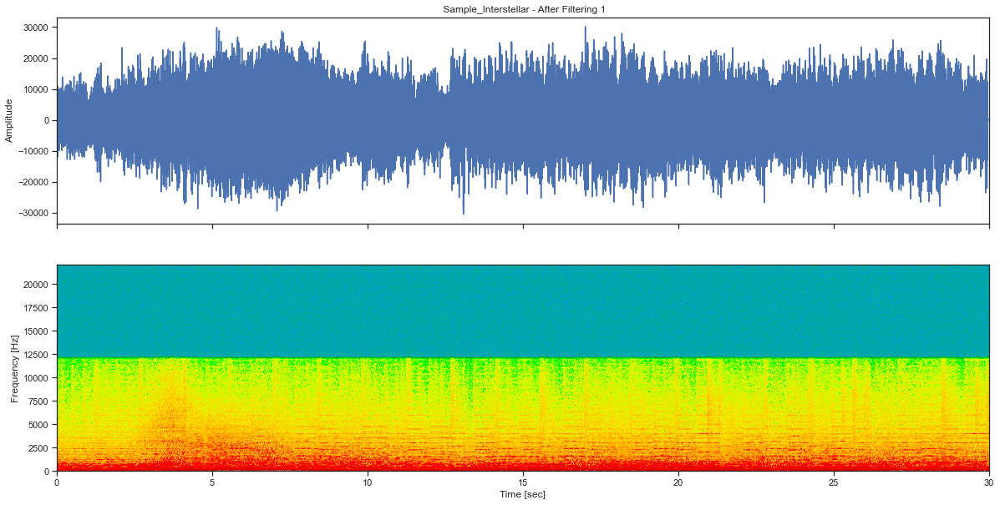

In [822]:
lp_samples_filtered = fir_low_pass(samples, sampleRate, 12000, 461, np.int16)             # First pass
lp_samples_filtered = fir_low_pass(lp_samples_filtered, sampleRate, 12000, 461, np.int16) # Second pass

plot_audio_samples(" Sample_Interstellar - After Filtering 1", lp_samples_filtered, sampleRate, tStart, tEnd)

In [823]:
Audio(data=lp_samples_filtered, rate = sampleRate) #son_filtré

# Création de l'information à transmettre

In [1010]:
"""
Description :
- Accepte toutes les dimensions de dessin (dans la limite du raisonnable, ne pas dépasser 30x30 pixel).
- PAR EXEMPLE pour dessiner le logo ESIEE, utilisez un fichier txt contenant ceci :

111110011111001000111110011111
110000011000001100110000011000
111110011111001100011110011111
110000000011001100110000011000
111110011111001100111110011111

- Ne pas oublier de fermer turtle avec la commande, bye().

"""


#dessin d'un pixel
def dessinerPixel(x , y):
    fillcolor("black")
    up()
    goto(x,y)
    down()
    begin_fill()
    for i in range(4):
        forward(20)
        left(90)
    end_fill()



#dessine l'image a partir du fichier txt mis en parametre
def dessinerASCII(nomFichier):
    #Variables
    x =-300
    y = 100

    #parametres du stylo
    speed(15)
    delay(0)
    hideturtle()

    fichier = open(nomFichier, "r")
    lignes = fichier.readlines()
    for ligne in lignes:
        for bit in ligne:
            if(bit == "1"):
                dessinerPixel(x , y)
            x+=20
        y-=20
        x=-300
    print("dessin terminé")
    
    
def binaire(s):
    ords = (ord(c) for c in s)
    shifts = (7, 6, 5, 4, 3, 2, 1, 0)
    return [(o >> shift) & 1 for o in ords for shift in shifts]

def char(bits):
    chars = []
    for b in range(int(len(bits) / 8)):
        byte = bits[b*8:(b+1)*8]
        chars.append(chr(int(''.join([str(bit) for bit in byte]), 2)))
    return ''.join(chars)


texte = " L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide d’un micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceintes"

texte_bin = binaire(texte) #Texte convertit en binaire
texte_binaire = np.array(texte_bin)#Permet de convertir list en array

image = np.array([1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0]) # message d'entrée

#msg = np.concatenate((image,texte_binaire)) #msg = image + texte que l'on souhaite transmettre 
msg=texte_binaire

# Modulation 16-QAM - Bits vers symboles

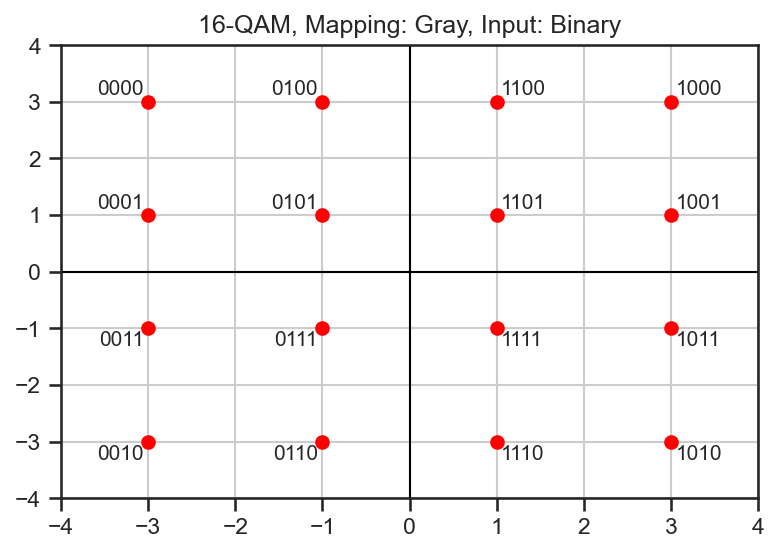

True

In [1011]:
modem = QAMModem(16, 
                 bin_input=True,
                 soft_decision=False,
                 bin_output=True)
modem.plot_const()

modulation = modem.modulate(msg) # modulation -> Moduler un tableau de bits en symboles de constellation

demodulation = modem.demodulate(modulation) #démodulation


#ici on veut s'assurer qu'il n'y a pas eu d'erreur dans la modulation et la démodulation
np.array_equal(msg, demodulation)#On regarde si le message de base est égal à ce qu'on a obtenu apres la demodulation

# Nyquist / etape convolution

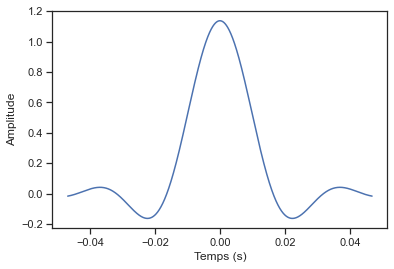

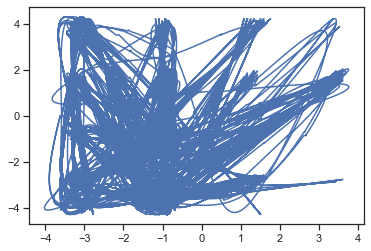

In [1012]:
import scipy
from commpy.filters import rrcosfilter

Fsamp = sampleRate # Sampling rate in Hz
Tsymbol = 0.0001875*100 # Symbol period in seconds
alpha = 1/2 # Roll off factor
N = int(5*Tsymbol*Fsamp) # Lenght of the filter in samples

temps, h_rc = rrcosfilter(N, alpha, Tsymbol, Fsamp)
# temps : array containing the time indices, in seconds, for the impulse response
# h_rc : impulse response of the raised cosine filter

plt.plot(temps, h_rc)
plt.ylabel('Amplitude')
plt.xlabel('Temps (s)')

plt.show()

# Train des symboles de cadence Tsymb
delta_symbols = np.zeros(len(modulation)*int(Tsymbol*Fsamp),dtype =complex)
delta_symbols[::int(Tsymbol*Fsamp)]= modulation

# convolution pour créer le signal d'information à émettre
convo = np.convolve(delta_symbols , h_rc, mode="same") 
plt.figure()
plt.plot(np.real(convo), np.imag(convo))

### Visualisation de l'information

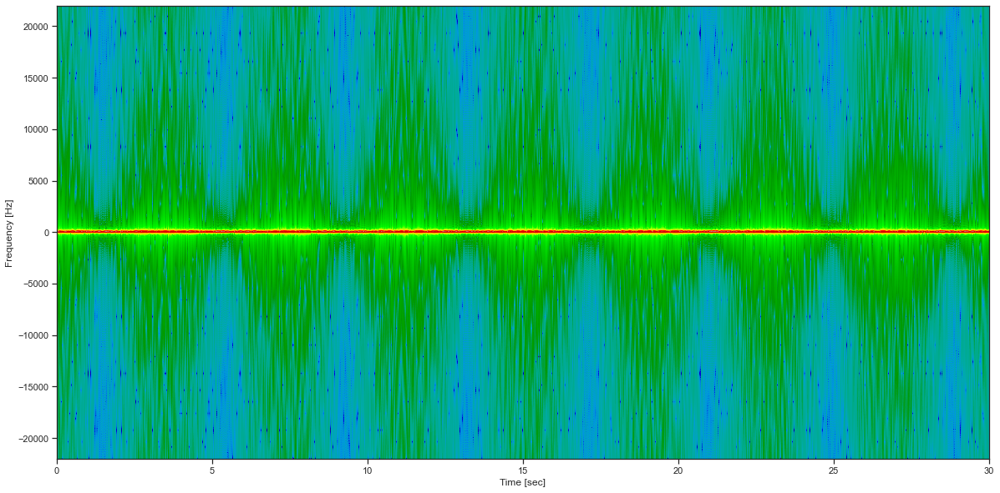

In [1013]:
plot_specgram(convo, sampleRate,tStart, tEnd)

# Shift en haute fréquence

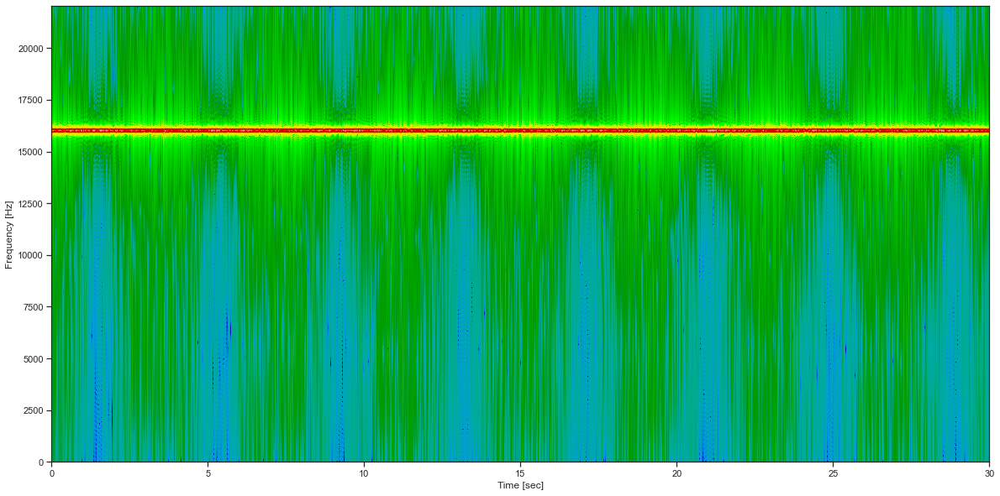

In [1014]:
Fcoupure = 16000 #Fréquence de coupure = milieu de la bande passante

t=np.linspace(0 , np.size(convo)/Fsamp , np.size(convo))
son = np.real(convo*np.exp(2*np.pi*1j*Fcoupure*t))
Audio ( data = son, rate = sampleRate)# son

plot_specgram(son, sampleRate,tStart, tEnd)


# Superposition des sons

921932
880516
921932
921932


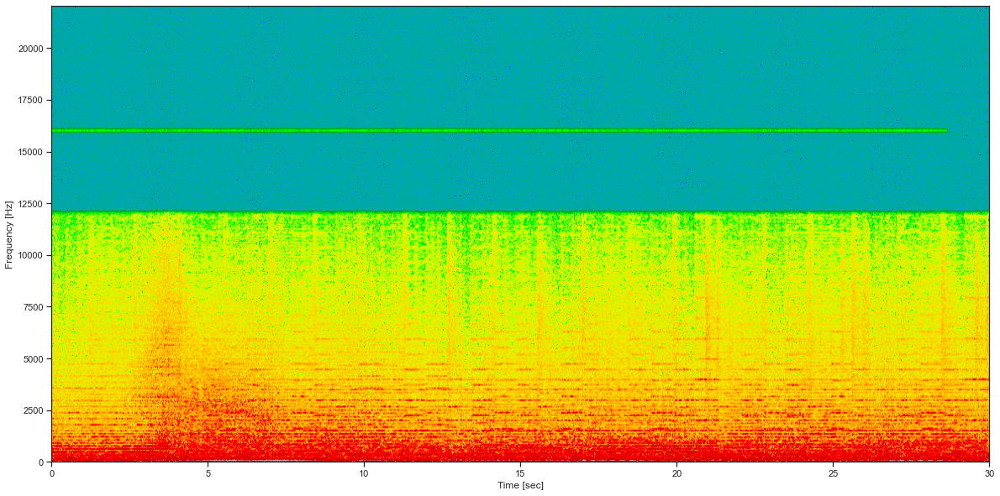

In [1015]:
print(len(lp_samples_filtered))
print(len(son))

x = np.zeros(len(lp_samples_filtered)-len(son))
son = np.append(son,x)
tmpsound = lp_samples_filtered + son # tmpsound = son porteur + info  
print(len(lp_samples_filtered))
print(len(son))

plot_specgram(tmpsound, sampleRate,tStart, tEnd)

Audio (tmpsound,rate =sampleRate) 

# Fin de la partie Emetteur

###  

# Canal

In [1016]:
#function to add gaussian noise

# x is my training data
# mu is the mean
# std is the standard deviation
def gaussian_noise(x,mu,std):
    noise = np.random.normal(mu, std, np.size(np.vectorize(x)))
    x_noisy = x + noise
    return x_noisy

In [1017]:
tmpsound2 = gaussian_noise(tmpsound, 0, 0)

In [1018]:
#tmpsound2.export('tmpsounds1.wav',format='wav')

###  

# Recepteur

## Filtrage basses fréquences

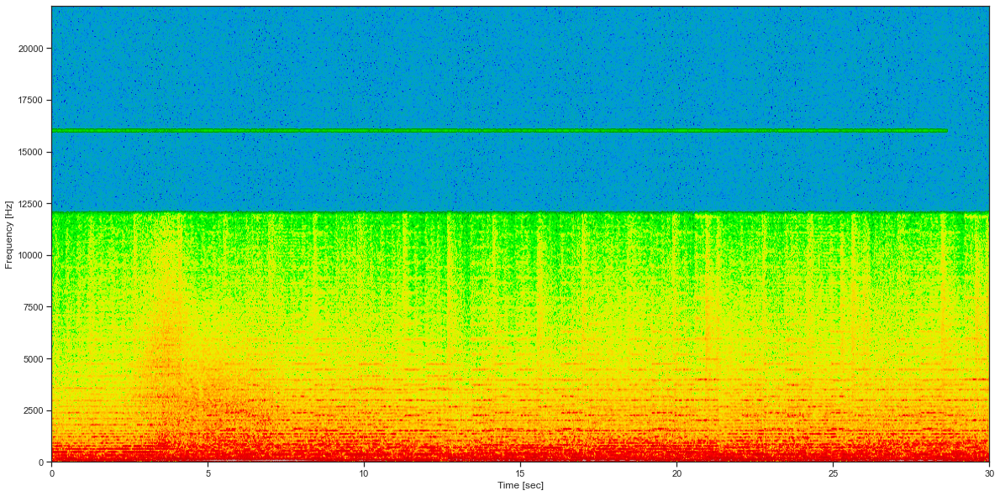

In [1040]:
channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('tmpsound.wav', tStart, tEnd)
samples2 = convert_to_mono(channels, nChannels, np.int16)

plot_specgram(samples2, sampleRate,tStart, tEnd)


In [1041]:
#Canal audio
zu, sigma = 0,0
z = np.random.normal(zu,sigma,np.size(samples2))

son_emetteur_noise = samples2 + z

random_desynch = np.random.randint(1,100)
vzeros = np.zeros(random_desynch,dtype = int)
son_recepteur = np.concatenate([vzeros,son_emetteur_noise])

In [1042]:
Audio(data= samples2,rate= sampleRate) #son_info

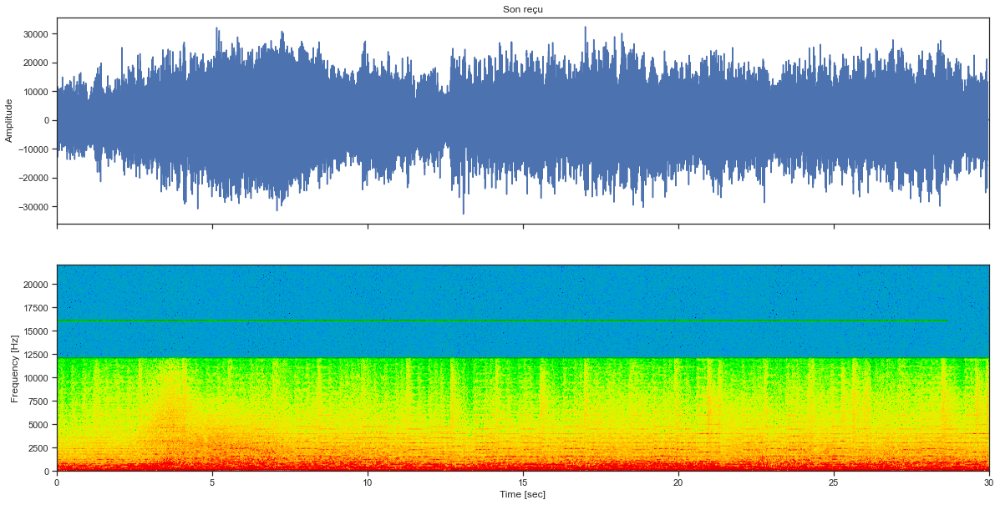

In [1043]:
plot_audio_samples("Son reçu", samples2, sampleRate, tStart, tEnd)

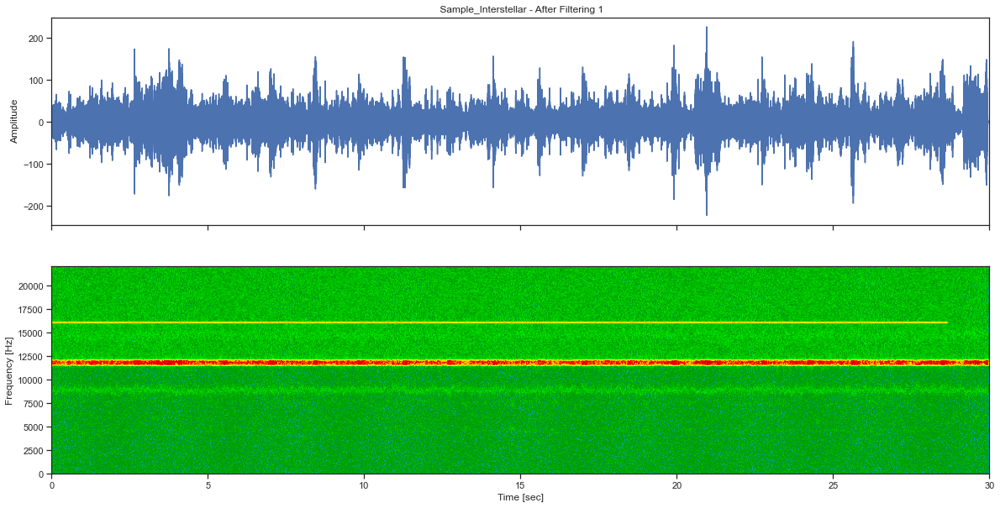

In [1078]:
lh_samples_filtered = fir_high_pass(son_recepteur, sampleRate, 11500, 461, np.int16)             # First pass
lh_samples_filtered = fir_high_pass(lh_samples_filtered, sampleRate, 11500, 461, np.int16) # Second pass

plot_audio_samples(" Sample_Interstellar - After Filtering 1", lh_samples_filtered, sampleRate, tStart, tEnd)

In [1079]:
Audio( data = lh_samples_filtered,rate = sampleRate) #msg_final

## Démodulation de fréquence

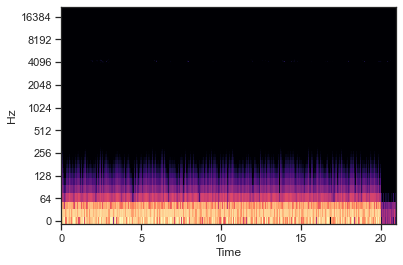

In [1080]:
Fp = 16000 #Fréquence porteuse
t = np.linspace(0,np.size(lh_samples_filtered)/Fsamp, np.size(lh_samples_filtered)) 

I_reel = 2*lh_samples_filtered*np.cos(2*np.pi*Fp*t) #composante réel en phase 
Q_quadrature = -2*lh_samples_filtered*np.sin(2*np.pi*Fp*t) #composante réel en quadrature


# Vérification son et son2 : normal de ne pas avoir les mêmes valeurs. 
# --> supprimer facteurs 2 de I_reel et Q_quadrature
son2 = I_reel*np.cos(2*np.pi*Fp*t)-Q_quadrature*np.sin(2*np.pi*Fp*t)
#print(son)
#print(son2) 

I = np.convolve (I_reel, h_rc,'same')
Q = np.convolve (Q_quadrature, h_rc,'same')

If2 = librosa.stft(I)
IdB2 = librosa.amplitude_to_db(abs(If2))

plt.figure()
librosa.display.specshow(IdB2, sr=Fsamp, x_axis='time', y_axis='log')

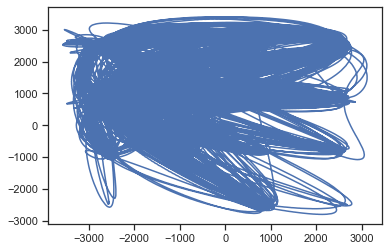

In [1081]:
x_t = I+1j*Q #signal complexe en bande de base


plt.figure()
plt.plot(np.real(x_t),np.imag(x_t))

# Echantillonnage

### Corrélation

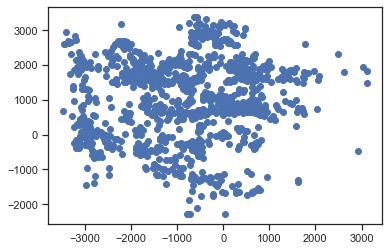

In [1082]:
sans_synchro = x_t[::int(Tsymbol*Fsamp)]
plt.figure()
plt.scatter(np.real(sans_synchro), np.imag(sans_synchro))

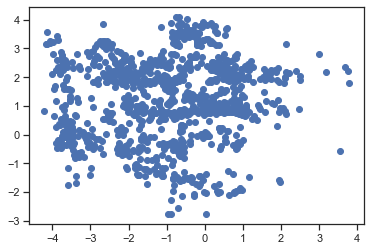

In [1083]:
convo_ss = np.convolve(h_rc,h_rc,'same')
Mconvo_ss =np.max(convo_ss)

div_ss =sans_synchro/Mconvo_ss

plt.figure()
plt.scatter(np.real(div_ss), np.imag(div_ss))

2113


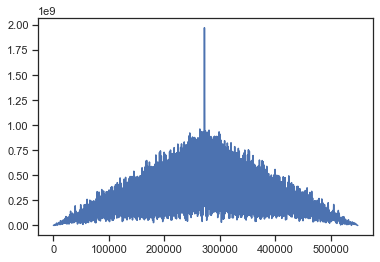

In [1096]:
texte_corr="L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique."
texte_bin_corr = binaire(texte_corr) #Texte convertit en binaire
texte_binaire_corr = np.array(texte_bin_corr)
msg_test = modem.modulate(texte_binaire_corr)


delta_symbols_corr = np.zeros(len(msg_test)*int(Tsymbol*Fsamp),dtype =complex)
delta_symbols_corr[::int(Tsymbol*Fsamp)]= msg_test

s_BB_oh = np.convolve(delta_symbols_corr, h_rc, mode="same") 

correl = scipy.signal.correlate(s_BB_oh,x_t[:np.size(s_BB_oh)])

plt.figure()
plt.plot(np.abs(correl))

rshift = np.size(s_BB_oh)-np.argmax(np.abs(correl))
print(rshift)

In [1097]:
corr_alpha =[]
A = np.linspace(0,1,1000)
for alpha in A :
    r_BB_coh_oh = x_t[rshift:(np.size(s_BB_oh)+rshift)]*np.exp(2j*np.pi*alpha)
    R = np.corrcoef(np.real(r_BB_coh_oh),np.real(s_BB_oh))
    corr_alpha.append((R[0,1]))
    
ccc = np.argmax(corr_alpha)


# Gain

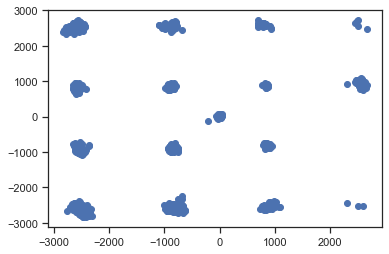

In [1098]:
test = x_t[rshift:]*np.exp(2j*np.pi*A[ccc])
test2 = test[::int(Fsamp*Tsymbol)]

plt.figure()
plt.scatter(np.real(test2),np.imag(test2))

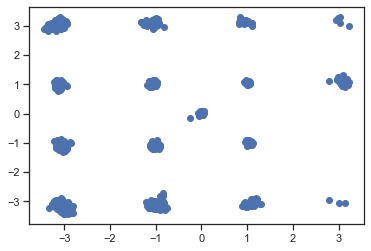

In [1099]:
convo2 = np.convolve(h_rc,h_rc,'same')
Mconvo2 =np.max(convo2)

div =test2/Mconvo2

plt.figure()
plt.scatter(np.real(div), np.imag(div))

# Demodulation : Bits vers symboles

In [1101]:
demodulation2 = modem.demodulate(div) # modulation -> Moduler un tableau de bits en symboles de constellation

demodulation2 = np.round(demodulation2).astype(int)
texte_char = char(demodulation2) #Convertit du binaire au texte -> Vérification de la conversion en binaire
print(texte_char)

L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide dun micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceinteswWWWÝÝ]ýUß÷Ýuu÷÷Ý}×_ß}ß×
